In [ ]:
!pip install -q transformers supervision pycocotools timm accelerate

In [6]:
import os
import shutil
import json
import csv
import random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration ---
IMAGES_PATH = '/kaggle/input/airportvehicledataset/images'
BBOXES_PATH = '/kaggle/input/airportvehicledataset/bboxes'
DATASET_PATH = '/kaggle/working/coco_airport_dataset'
CATEGORIES = [
    {'id': 0, 'name': 'Airside Safety Vehicle'}, {'id': 1, 'name': 'Ambulance Vehicle'},
    {'id': 2, 'name': 'Business Jet'}, {'id': 3, 'name': 'Cargo Airplane'},
    {'id': 4, 'name': 'Cleaning Vehicle'}, {'id': 5, 'name': 'Common Aircraft'},
    {'id': 6, 'name': 'Container Trolley'}, {'id': 7, 'name': 'Container Trolley Type A'},
    {'id': 8, 'name': 'Container Trolley Type B'}, {'id': 9, 'name': 'Container Trolley Type C'},
    {'id': 10, 'name': 'Conveyer Vehicle'}, {'id': 11, 'name': 'Fire Truck'},
    {'id': 12, 'name': 'Forklift'}, {'id': 13, 'name': 'Helicopter'},
    {'id': 14, 'name': 'Loading Ramp'}, {'id': 15, 'name': 'Loading Vehicle'},
    {'id': 16, 'name': 'Other Objects'}, {'id': 17, 'name': 'Other Vehicles'},
    {'id': 18, 'name': 'Passenger Bus'}, {'id': 19, 'name': 'Passenger Jet'},
    {'id': 20, 'name': 'Passenger Stairway'}, {'id': 21, 'name': 'Pedestrian Crossing'},
    {'id': 22, 'name': 'Person Wearing Reflective Vests'}, {'id': 23, 'name': 'Rescue Helicopter'},
    {'id': 24, 'name': 'Sanitary Truck'}, {'id': 25, 'name': 'Snowplow'},
    {'id': 26, 'name': 'Speed Limit 30'}, {'id': 27, 'name': 'Standard Car'},
    {'id': 28, 'name': 'Standard Truck'}, {'id': 29, 'name': 'Tank Truck'},
    {'id': 30, 'name': 'Taxiing Vehicle'}, {'id': 31, 'name': 'Tow Vehicle'},
    {'id': 32, 'name': 'Tractor'}, {'id': 33, 'name': 'Traffic Barrier'},
    {'id': 34, 'name': 'Traffic Cone'}, {'id': 35, 'name': 'Traffic Cone - Off'},
    {'id': 36, 'name': 'Traffic Cone - On'}, {'id': 37, 'name': 'Traffic Cone - Standard'},
    {'id': 38, 'name': 'Traffic Sign'}, {'id': 39, 'name': 'Transport Container'},
    {'id': 40, 'name': 'Transport Vehicle'}, {'id': 41, 'name': 'Warning Sign'},
    {'id': 42, 'name': 'Person'}
]
CLASS_NAMES = [cat['name'] for cat in CATEGORIES]
NUM_CLASSES = len(CLASS_NAMES)

# --- Data Splitting and Conversion Logic ---
if os.path.exists(DATASET_PATH): shutil.rmtree(DATASET_PATH)
train_img_dir = os.path.join(DATASET_PATH, 'train2017')
val_img_dir = os.path.join(DATASET_PATH, 'val2017')
ann_dir = os.path.join(DATASET_PATH, 'annotations')
os.makedirs(train_img_dir, exist_ok=True); os.makedirs(val_img_dir, exist_ok=True); os.makedirs(ann_dir, exist_ok=True)

def convert_to_coco(image_filenames, image_dir, anno_path):
    coco_data = {"info": {}, "licenses": [], "images": [], "annotations": [], "categories": CATEGORIES}
    annotation_id_counter = 0
    print(f"Processing data for {os.path.basename(anno_path)}...")
    for image_id, img_file in enumerate(tqdm(image_filenames)):
        shutil.copy(os.path.join(IMAGES_PATH, img_file), image_dir)
        try:
            with Image.open(os.path.join(IMAGES_PATH, img_file)) as img: width, height = img.size
            coco_data["images"].append({"id": image_id, "width": width, "height": height, "file_name": img_file})
            bbox_file = os.path.splitext(img_file)[0] + '.csv'
            bbox_path = os.path.join(BBOXES_PATH, bbox_file)
            if os.path.exists(bbox_path):
                with open(bbox_path, 'r') as f:
                    reader = csv.DictReader(f)
                    for row in reader:
                        class_id = int(row['label'])
                        if 0 <= class_id < NUM_CLASSES:
                            xmin, ymin, xmax, ymax = float(row['tlx']), float(row['tly']), float(row['brx']), float(row['bry'])
                            w, h = xmax - xmin, ymax - ymin
                            coco_data["annotations"].append({"id": annotation_id_counter, "image_id": image_id, "category_id": class_id, "bbox": [xmin, ymin, w, h], "area": w * h, "iscrowd": 0, "segmentation": []})
                            annotation_id_counter += 1
        except Exception as e: print(f"Skipping {img_file} due to error: {e}")
    with open(anno_path, 'w') as f: json.dump(coco_data, f, indent=4)
    print(f"Created {anno_path}")

all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42); random.shuffle(all_image_files)
split_index = int(len(all_image_files) * 0.9)
train_files, val_files = all_image_files[:split_index], all_image_files[split_index:]
convert_to_coco(train_files, train_img_dir, os.path.join(ann_dir, 'instances_train2017.json'))
convert_to_coco(val_files, val_img_dir, os.path.join(ann_dir, 'instances_val2017.json'))
print("\nDataset preparation for DETR is complete! ✅")

Processing data for instances_train2017.json...


  0%|          | 0/7275 [00:00<?, ?it/s]

Created /kaggle/working/coco_airport_dataset/annotations/instances_train2017.json
Processing data for instances_val2017.json...


  0%|          | 0/809 [00:00<?, ?it/s]

Created /kaggle/working/coco_airport_dataset/annotations/instances_val2017.json

Dataset preparation for DETR is complete! ✅


In [7]:
import torch
from torch.utils.data import Dataset, DataLoader
from pycocotools.coco import COCO
import os
from PIL import Image
from transformers import DetrImageProcessor

class CocoDetectionDataset(Dataset):
    def __init__(self, image_dir, annotation_file, processor):
        self.image_dir = image_dir
        self.coco = COCO(annotation_file)
        self.processor = processor
        self.image_ids = self.coco.getImgIds()

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_info = self.coco.loadImgs(image_id)[0]
        image = Image.open(os.path.join(self.image_dir, image_info['file_name'])).convert("RGB")
        ann_ids = self.coco.getAnnIds(imgIds=image_id)
        anns = self.coco.loadAnns(ann_ids)
        target = {'image_id': image_id, 'annotations': anns}
        return image, target

def collate_fn(batch):
    pixel_values = [item[0] for item in batch]
    annotations = [item[1] for item in batch]
    encoding = processor(images=pixel_values, annotations=annotations, return_tensors="pt")
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in encoding['labels']]
    pixel_values = encoding['pixel_values'].to(DEVICE)
    pixel_mask = encoding['pixel_mask'].to(DEVICE)
    return {'pixel_values': pixel_values, 'pixel_mask': pixel_mask, 'labels': labels}

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

train_dataset = CocoDetectionDataset(os.path.join(DATASET_PATH, 'train2017'), os.path.join(DATASET_PATH, 'annotations', 'instances_train2017.json'), processor)
val_dataset = CocoDetectionDataset(os.path.join(DATASET_PATH, 'val2017'), os.path.join(DATASET_PATH, 'annotations', 'instances_val2017.json'), processor)

# --- THE FIX: Reduce the batch size to 2 to minimize memory per step ---
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)

print("Dataloaders created successfully! ✅")

loading annotations into memory...
Done (t=1.21s)
creating index...
index created!
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Dataloaders created successfully! ✅


In [ ]:
import torch
from transformers import DetrForObjectDetection, DetrConfig
from torch.optim import AdamW
from tqdm.notebook import tqdm
from torch.cuda.amp import GradScaler, autocast

# --- Configuration ---
MODEL_ID = "facebook/detr-resnet-50"
NUM_EPOCHS = 1
LR = 1e-4  # Learning rate for the new classification head
LR_BACKBONE = 1e-6 # A very small learning rate for the pre-trained backbone

# --- Load and Configure the Model ---
id2label = {cat['id']: cat['name'] for cat in CATEGORIES}
config = DetrConfig.from_pretrained(MODEL_ID, num_labels=NUM_CLASSES, id2label=id2label, label2id={v: k for k, v in id2label.items()})
model = DetrForObjectDetection.from_pretrained(MODEL_ID, config=config, ignore_mismatched_sizes=True).to(DEVICE)

# --- THE FIX: Create two parameter groups for the optimizer ---
param_dicts = [
    {"params": [p for n, p in model.named_parameters() if "backbone" not in n and p.requires_grad]},
    {"params": [p for n, p in model.named_parameters() if "backbone" in n and p.requires_grad], "lr": LR_BACKBONE},
]
optimizer = AdamW(param_dicts, lr=LR)
scaler = GradScaler()
loss_history = []

# --- Training Loop ---
print("--- Starting Fine-Tuning with Differential Learning Rates ---")
for epoch in range(NUM_EPOCHS):
    model.train()
    total_loss = 0
    progress_bar = tqdm(train_dataloader, desc=f"Epoch {epoch + 1}/{NUM_EPOCHS}")
    
    for batch in progress_bar:
        with autocast():
            outputs = model(**batch)
            loss = outputs.loss
        
        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        total_loss += loss.item()
        progress_bar.set_postfix({'loss': f"{loss.item():.4f}"})
        
    avg_loss = total_loss / len(train_dataloader)
    loss_history.append(avg_loss)
    print(f"--- Epoch {epoch + 1} finished --- Average Loss: {avg_loss:.4f} ---")

# --- Save the Fine-Tuned Model ---
output_dir = "/kaggle/working/detr-finetuned-airport"
model.save_pretrained(output_dir)
processor.save_pretrained(output_dir)
print(f"\nFine-tuning complete! Model saved to: {output_dir} ✅")

--- Loading fine-tuned model for inference ---

--- Step 2: Plotting Learning and Loss Curves ---
Loss history not available.

--- Step 3: Generating Classification Report (mAP) ---


Evaluating on validation set:   0%|          | 0/809 [00:00<?, ?it/s]

Loading and preparing results...
DONE (t=0.72s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.52s).
Accumulating evaluation results...
DONE (t=1.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.012
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.015
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

Building Confusion Matrix:   0%|          | 0/809 [00:00<?, ?it/s]

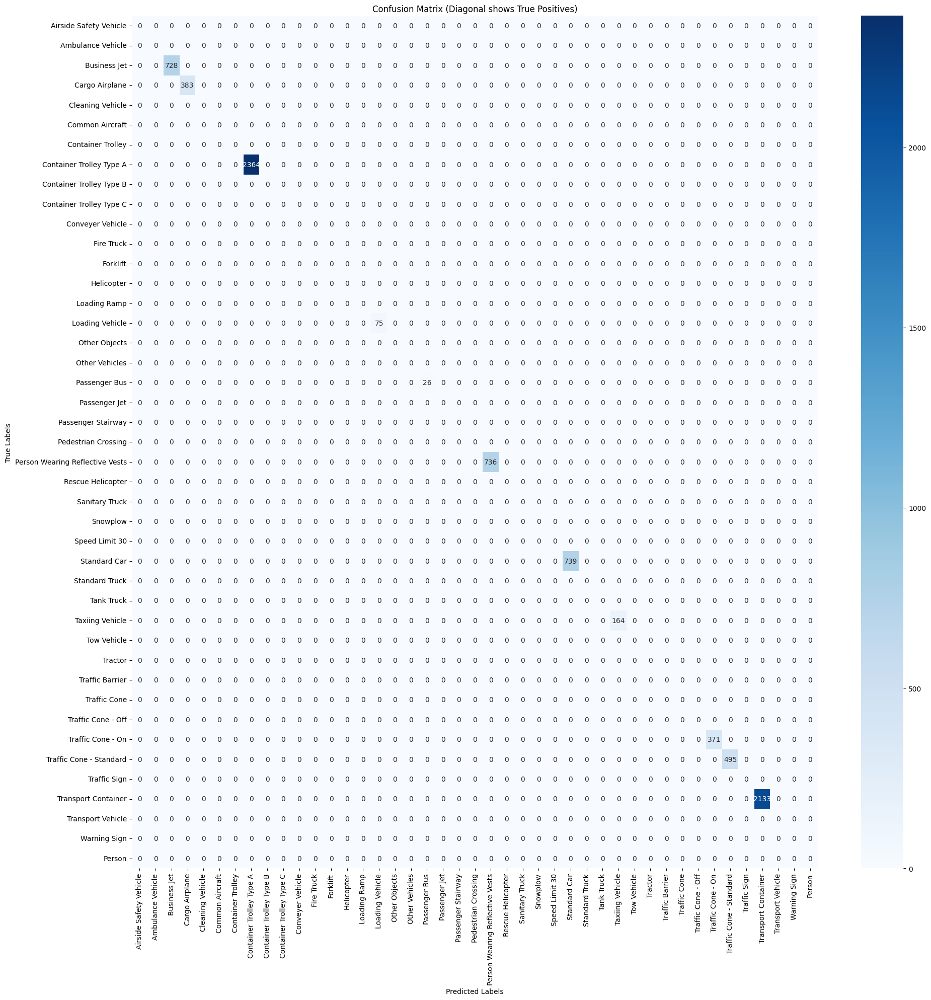

In [9]:
import supervision as sv
import random
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
# --- THE FIX: Import COCOeval from its correct module ---
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import torch
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
from PIL import Image
from tqdm.notebook import tqdm
from IPython.display import display

# --- 1. Load the Fine-Tuned Model ---
print("--- Loading fine-tuned model for inference ---")
model_path = "/kaggle/working/detr-finetuned-airport"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
processor = DetrImageProcessor.from_pretrained("/kaggle/working/detr-finetuned-airport")
model = DetrForObjectDetection.from_pretrained("/kaggle/working/detr-finetuned-airport").to(DEVICE)

# # --- 2. Test and Visualize Predictions on Sample Images ---
# print("\n--- Step 1: Visualizing predictions on 5 sample images ---")
# val_image_ids = random.sample(val_dataset.image_ids, 5)
# id2label = {id: name for id, name in enumerate(CLASS_NAMES)}

# for image_id in val_image_ids:
#     image_info = val_dataset.coco.loadImgs(image_id)[0]
#     image_path = os.path.join(val_dataset.image_dir, image_info['file_name'])
#     image = Image.open(image_path).convert("RGB")
    
#     encoding = processor(images=image, return_tensors="pt")
#     pixel_values = encoding["pixel_values"].to(DEVICE)
    
#     with torch.no_grad():
#         outputs = model(pixel_values=pixel_values)
        
#     target_sizes = torch.tensor([image.size[::-1]], device=DEVICE)
#     results = processor.post_process_object_detection(outputs, threshold=0.25, target_sizes=target_sizes)[0]
    
#     boxes = results['boxes'].cpu().numpy()
#     scores = results['scores'].cpu().numpy()
#     labels = results['labels'].cpu().numpy()
    
#     detections = sv.Detections(xyxy=boxes)
    
#     print(f"\nPredictions for: {image_info['file_name']}")
    
#     if len(detections.xyxy) > 0:
#         detections.labels = [f"{id2label[label]} {score:.2f}" for label, score in zip(labels, scores)]

#         # Use separate annotators for boxes and labels for clear visualization
#         box_annotator = sv.BoxAnnotator(thickness=4)
#         label_annotator = sv.LabelAnnotator(text_thickness=2, text_scale=1.0)
        
#         annotated_image = box_annotator.annotate(scene=np.array(image).copy(), detections=detections)
#         annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=detections.labels)
        
#         sv.plot_image(annotated_image, (12, 12))
#     else:
#         print("No objects detected in this image.")
#         display(image)

# --- 3. Generate Learning and Loss Curves ---
print("\n--- Step 2: Plotting Learning and Loss Curves ---")
if 'loss_history' in locals() and len(loss_history) > 0:
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(loss_history) + 1), loss_history, marker='o', linestyle='-', color='royalblue')
    plt.title('Training Loss per Epoch'); plt.xlabel('Epoch'); plt.ylabel('Average Loss'); plt.grid(True)
    plt.savefig('detr_loss_curve.png')
    plt.show()
else:
    print("Loss history not available.")

# --- 4. Generate Classification Report (mAP) ---
print("\n--- Step 3: Generating Classification Report (mAP) ---")
coco_gt = val_dataset.coco
results_json = []
for image_id in tqdm(val_dataset.image_ids, desc="Evaluating on validation set"):
    image_info = coco_gt.loadImgs(image_id)[0]
    image_path = os.path.join(val_dataset.image_dir, image_info['file_name'])
    image = Image.open(image_path).convert("RGB")
    encoding = processor(images=image, return_tensors="pt")
    pixel_values = encoding["pixel_values"].to(DEVICE)
    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)
    target_sizes = torch.tensor([image.size[::-1]], device=DEVICE)
    results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)[0]
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = [round(i, 2) for i in box.tolist()]
        results_json.append({"image_id": image_id, "category_id": label.item(), "bbox": [box[0], box[1], box[2] - box[0], box[3] - box[1]], "score": round(score.item(), 3)})

pred_path = '/kaggle/working/predictions.json'
with open(pred_path, 'w') as f: json.dump(results_json, f)
coco_dt = coco_gt.loadRes(pred_path)
coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
coco_eval.evaluate(); coco_eval.accumulate(); coco_eval.summarize()

# --- 5. Generate Confusion Matrix ---
print("\n--- Step 4: Generating Confusion Matrix ---")
confusion_matrix = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int32)
for img_id in tqdm(val_dataset.image_ids, desc="Building Confusion Matrix"):
    gt_ann_ids = coco_gt.getAnnIds(imgIds=img_id)
    gt_anns = coco_gt.loadAnns(gt_ann_ids)
    gt_classes = [ann['category_id'] for ann in gt_anns]
    dt_ann_ids = coco_dt.getAnnIds(imgIds=img_id)
    dt_anns = coco_dt.loadAnns(dt_ann_ids)
    dt_classes = [ann['category_id'] for ann in dt_anns]
    for gt_cls in gt_classes:
        if gt_cls in dt_classes:
            confusion_matrix[gt_cls, gt_cls] += 1

fig, ax = plt.subplots(figsize=(22, 22))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
plt.xticks(rotation=90); plt.yticks(rotation=0)
ax.set_xlabel('Predicted Labels'); ax.set_ylabel('True Labels'); ax.set_title('Confusion Matrix (Diagonal shows True Positives)')
plt.savefig('detr_confusion_matrix.png')
plt.show()

In [2]:
import os
import random

# Get a list of all your image files
all_image_files = [f for f in os.listdir('/kaggle/input/airportvehicledataset/images') if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42)
random.shuffle(all_image_files)

# Select 5 random images to test
test_image_files = all_image_files[:5]
image_paths = [os.path.join('/kaggle/input/airportvehicledataset/images', fname) for fname in test_image_files]

print(f"Selected {len(image_paths)} images for testing:")
print(image_paths)

Selected 5 images for testing:
['/kaggle/input/airportvehicledataset/images/aut-0982-00007943.jpg', '/kaggle/input/airportvehicledataset/images/aut-1168-00007056.jpg', '/kaggle/input/airportvehicledataset/images/aut-1082-00003727.jpg', '/kaggle/input/airportvehicledataset/images/aut-0356-00006608.jpg', '/kaggle/input/airportvehicledataset/images/aut-0555-00008636.jpg']


## Rsults After FineTuning


--- Processing: aut-0982-00007943.jpg ---


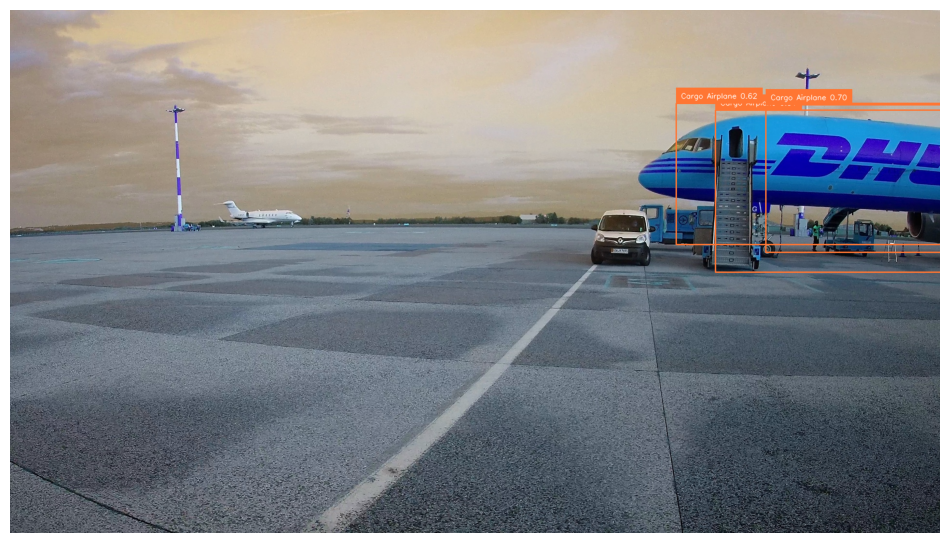


--- Processing: aut-1168-00007056.jpg ---
No objects detected in this image with the current threshold.


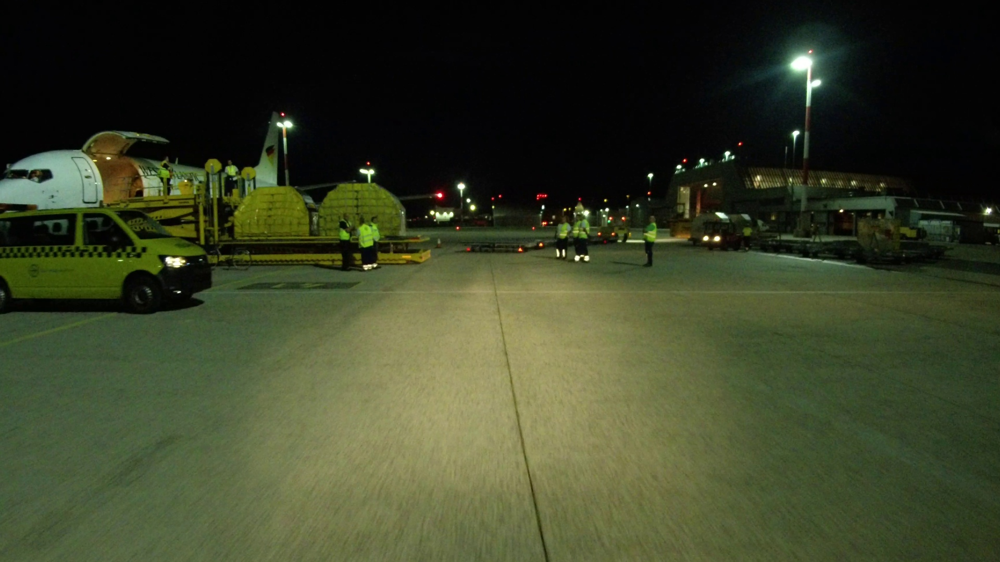


--- Processing: aut-1082-00003727.jpg ---


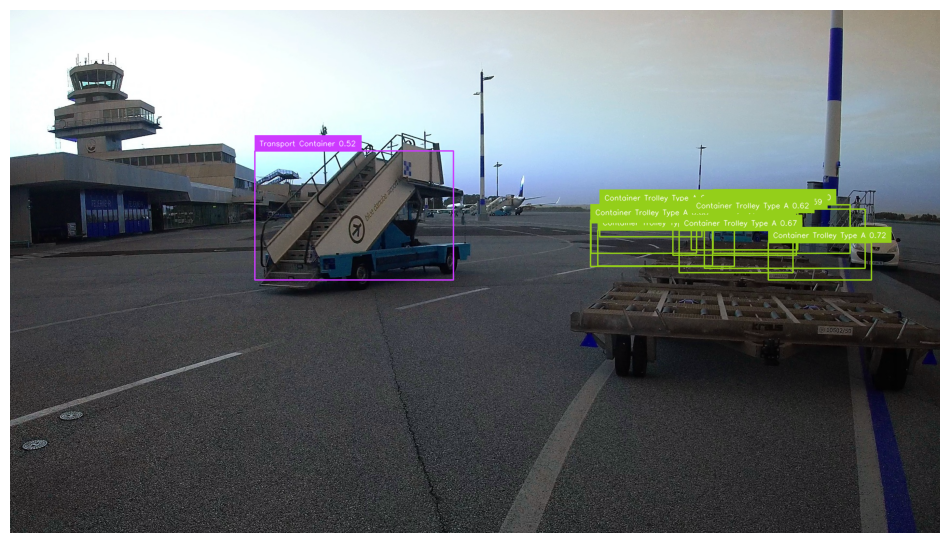


--- Processing: aut-0356-00006608.jpg ---


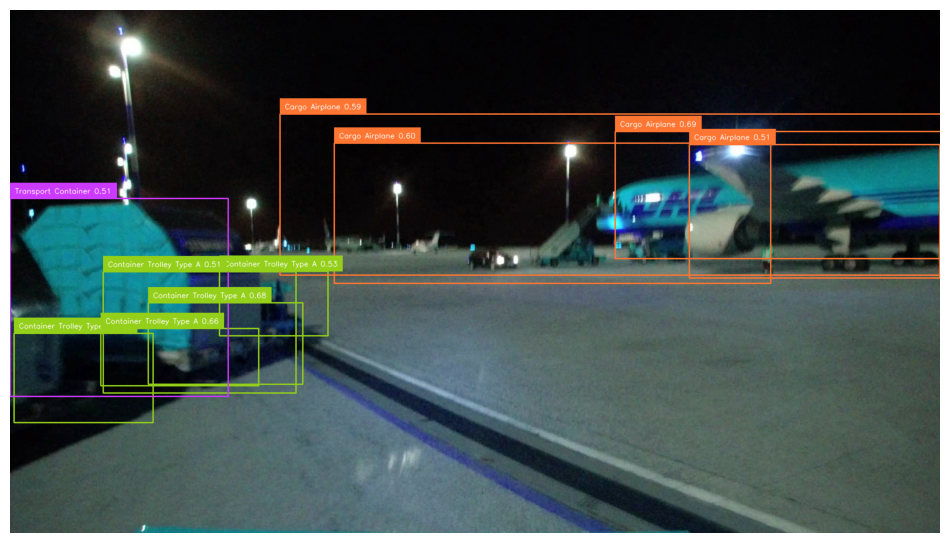


--- Processing: aut-0555-00008636.jpg ---


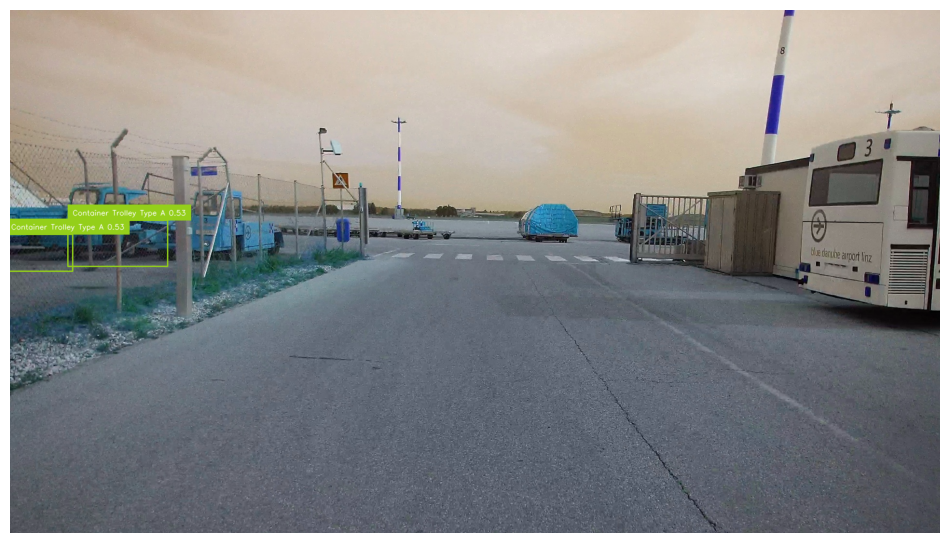

In [11]:
import torch
from PIL import Image
import requests
from transformers import DetrImageProcessor, DetrForObjectDetection
import supervision as sv
import numpy as np

# --- 1. Load the Pre-trained Model and Processor ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
processor = DetrImageProcessor.from_pretrained("/kaggle/working/detr-finetuned-airport")
model = DetrForObjectDetection.from_pretrained("/kaggle/working/detr-finetuned-airport").to(DEVICE)

# Get the model's class names
id2label = model.config.id2label

# --- 2. Create Annotators for Visualization ---
box_annotator = sv.BoxAnnotator(thickness=2)
label_annotator = sv.LabelAnnotator(text_thickness=1, text_scale=0.5)

# --- 3. Loop Through Images and Run Inference ---
for image_path in image_paths:
    print(f"\n--- Processing: {os.path.basename(image_path)} ---")
    image = Image.open(image_path).convert("RGB")

    # Prepare the image for the model
    encoding = processor(images=image, return_tensors="pt")
    pixel_values = encoding["pixel_values"].to(DEVICE)

    # Perform inference
    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)

    # Post-process the results
    target_sizes = torch.tensor([image.size[::-1]], device=DEVICE)
    results = processor.post_process_object_detection(outputs, threshold=0.5, target_sizes=target_sizes)[0]
    
    # Check if any objects were detected
    if len(results["scores"]) > 0:
        # Convert to Supervision Detections object
        detections = sv.Detections(
            xyxy=results["boxes"].cpu().numpy(),
            confidence=results["scores"].cpu().numpy(),
            class_id=results["labels"].cpu().numpy(),
        )
        
        # Create labels with class names and confidence scores
        labels = [f"{id2label[class_id]} {confidence:.2f}" for class_id, confidence in zip(detections.class_id, detections.confidence)]
        
        # Annotate the image
        annotated_image = box_annotator.annotate(scene=np.array(image).copy(), detections=detections)
        annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)
        
        # Display the result
        sv.plot_image(annotated_image, (12, 12))
    else:
        print("No objects detected in this image with the current threshold.")
        display(image)

## Results Before FineTuning

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).



--- Processing: aut-0982-00007943.jpg ---


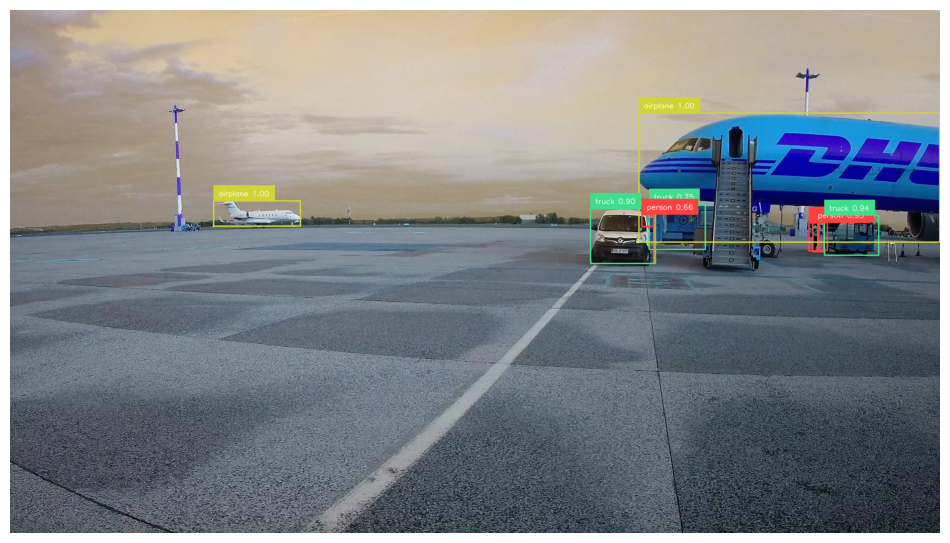


--- Processing: aut-1168-00007056.jpg ---


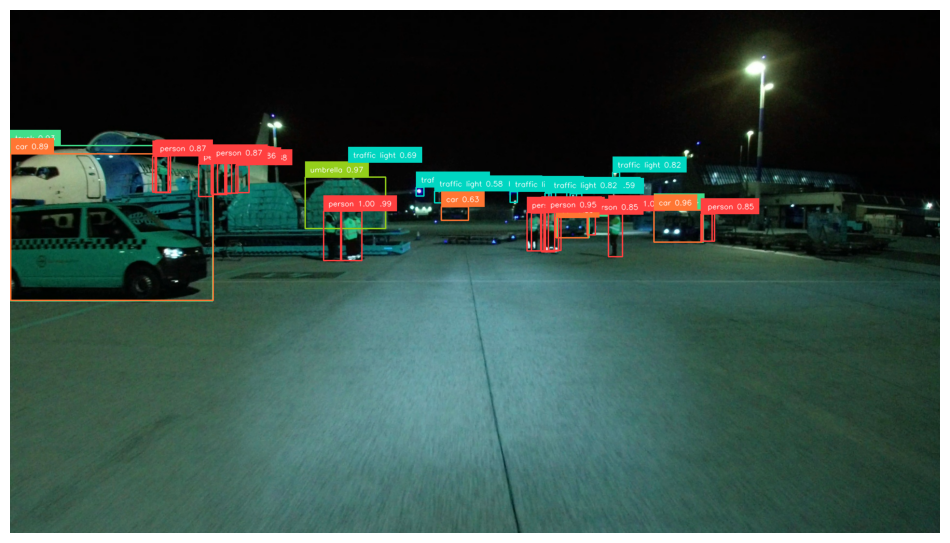


--- Processing: aut-1082-00003727.jpg ---


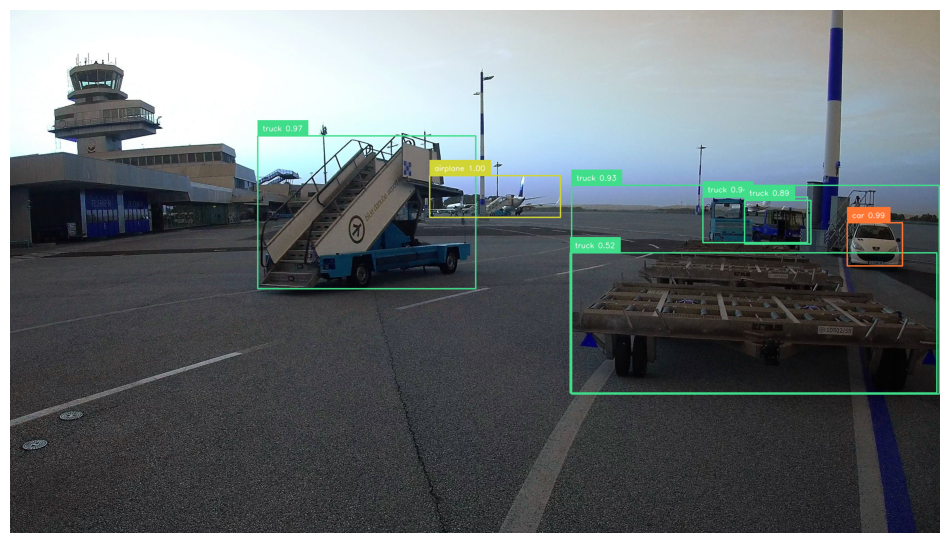


--- Processing: aut-0356-00006608.jpg ---


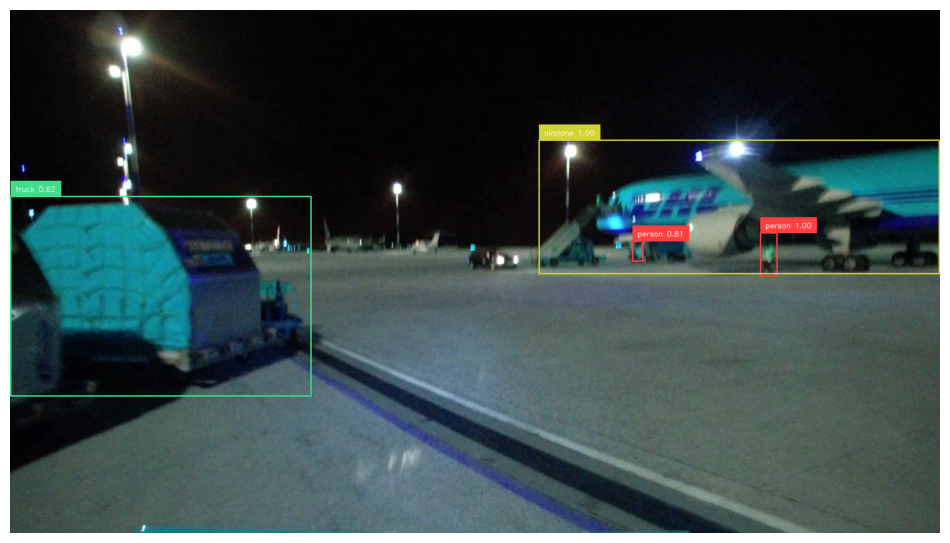


--- Processing: aut-0555-00008636.jpg ---


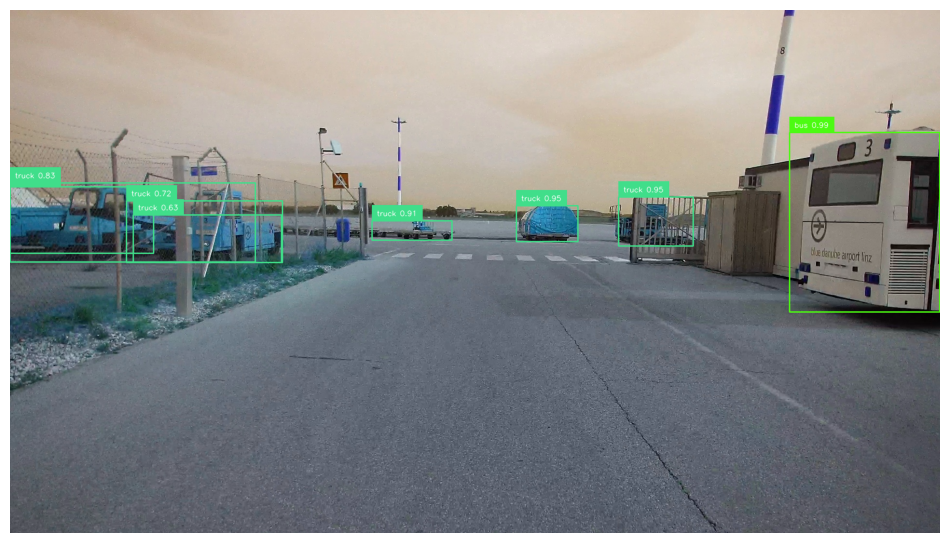

In [10]:
import torch
from PIL import Image
import requests
from transformers import DetrImageProcessor, DetrForObjectDetection
import supervision as sv
import numpy as np

# --- 1. Load the Pre-trained Model and Processor ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50").to(DEVICE)

# Get the model's class names
id2label = model.config.id2label

# --- 2. Create Annotators for Visualization ---
box_annotator = sv.BoxAnnotator(thickness=2)
label_annotator = sv.LabelAnnotator(text_thickness=1, text_scale=0.5)

# --- 3. Loop Through Images and Run Inference ---
for image_path in image_paths:
    print(f"\n--- Processing: {os.path.basename(image_path)} ---")
    image = Image.open(image_path).convert("RGB")

    # Prepare the image for the model
    encoding = processor(images=image, return_tensors="pt")
    pixel_values = encoding["pixel_values"].to(DEVICE)

    # Perform inference
    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)

    # Post-process the results
    target_sizes = torch.tensor([image.size[::-1]], device=DEVICE)
    results = processor.post_process_object_detection(outputs, threshold=0.5, target_sizes=target_sizes)[0]
    
    # Check if any objects were detected
    if len(results["scores"]) > 0:
        # Convert to Supervision Detections object
        detections = sv.Detections(
            xyxy=results["boxes"].cpu().numpy(),
            confidence=results["scores"].cpu().numpy(),
            class_id=results["labels"].cpu().numpy(),
        )
        
        # Create labels with class names and confidence scores
        labels = [f"{id2label[class_id]} {confidence:.2f}" for class_id, confidence in zip(detections.class_id, detections.confidence)]
        
        # Annotate the image
        annotated_image = box_annotator.annotate(scene=np.array(image).copy(), detections=detections)
        annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)
        
        # Display the result
        sv.plot_image(annotated_image, (12, 12))
    else:
        print("No objects detected in this image with the current threshold.")
        display(image)

## 6 class training

In [ ]:
!pip install -q transformers supervision pycocotools timm accelerate

In [1]:
import os
import shutil
import json
import csv
import random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration ---
IMAGES_PATH = '/kaggle/input/airportvehicledataset/images'
BBOXES_PATH = '/kaggle/input/airportvehicledataset/bboxes'
DATASET_PATH = '/kaggle/working/coco_airport_dataset'

# --- Keep only 6 classes, remap IDs to 0..5 ---
ID_MAP = {
    2: 0,   # Business Jet
    3: 1,   # Cargo Airplane
    7: 2,   # Container Trolley Type A
    22: 3,  # Person Wearing Reflective Vests
    27: 4,  # Standard Car
    39: 5   # Transport Container
}

CATEGORIES = [
    {'id': 0, 'name': 'Business Jet'},
    {'id': 1, 'name': 'Cargo Airplane'},
    {'id': 2, 'name': 'Container Trolley Type A'},
    {'id': 3, 'name': 'Person Wearing Reflective Vests'},
    {'id': 4, 'name': 'Standard Car'},
    {'id': 5, 'name': 'Transport Container'}
]

CLASS_NAMES = [cat['name'] for cat in CATEGORIES]
NUM_CLASSES = len(CLASS_NAMES)

# --- Setup dataset dirs ---
if os.path.exists(DATASET_PATH): 
    shutil.rmtree(DATASET_PATH)

train_img_dir = os.path.join(DATASET_PATH, 'train2017')
val_img_dir = os.path.join(DATASET_PATH, 'val2017')
ann_dir = os.path.join(DATASET_PATH, 'annotations')

os.makedirs(train_img_dir, exist_ok=True)
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(ann_dir, exist_ok=True)

def convert_to_coco(image_filenames, image_dir, anno_path):
    coco_data = {
        "info": {}, 
        "licenses": [], 
        "images": [], 
        "annotations": [], 
        "categories": CATEGORIES
    }
    annotation_id_counter = 0

    print(f"Processing data for {os.path.basename(anno_path)}...")

    for image_id, img_file in enumerate(tqdm(image_filenames)):
        # copy image
        shutil.copy(os.path.join(IMAGES_PATH, img_file), image_dir)

        try:
            with Image.open(os.path.join(IMAGES_PATH, img_file)) as img:
                width, height = img.size

            coco_data["images"].append({
                "id": image_id, 
                "width": width, 
                "height": height, 
                "file_name": img_file
            })

            bbox_file = os.path.splitext(img_file)[0] + '.csv'
            bbox_path = os.path.join(BBOXES_PATH, bbox_file)

            if os.path.exists(bbox_path):
                with open(bbox_path, 'r') as f:
                    reader = csv.DictReader(f)
                    for row in reader:
                        old_id = int(row['label'])
                        if old_id in ID_MAP:  # keep only selected 6
                            class_id = ID_MAP[old_id]
                            xmin, ymin = float(row['tlx']), float(row['tly'])
                            xmax, ymax = float(row['brx']), float(row['bry'])
                            w, h = xmax - xmin, ymax - ymin

                            coco_data["annotations"].append({
                                "id": annotation_id_counter,
                                "image_id": image_id,
                                "category_id": class_id,
                                "bbox": [xmin, ymin, w, h],
                                "area": w * h,
                                "iscrowd": 0,
                                "segmentation": []
                            })
                            annotation_id_counter += 1

        except Exception as e:
            print(f"⚠️ Skipping {img_file} due to error: {e}")

    with open(anno_path, 'w') as f:
        json.dump(coco_data, f, indent=4)

    print(f"✅ Created {anno_path}")

# --- Split train/val ---
all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42)
random.shuffle(all_image_files)

split_index = int(len(all_image_files) * 0.9)
train_files, val_files = all_image_files[:split_index], all_image_files[split_index:]

# --- Convert to COCO ---
convert_to_coco(train_files, train_img_dir, os.path.join(ann_dir, 'instances_train2017.json'))
convert_to_coco(val_files, val_img_dir, os.path.join(ann_dir, 'instances_val2017.json'))

print("\n✅ Dataset preparation for DETR (6 classes) is complete!")


Processing data for instances_train2017.json...


  0%|          | 0/7275 [00:00<?, ?it/s]

✅ Created /kaggle/working/coco_airport_dataset/annotations/instances_train2017.json
Processing data for instances_val2017.json...


  0%|          | 0/809 [00:00<?, ?it/s]

✅ Created /kaggle/working/coco_airport_dataset/annotations/instances_val2017.json

✅ Dataset preparation for DETR (6 classes) is complete!


In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
from pycocotools.coco import COCO
import os
from PIL import Image
from transformers import DetrImageProcessor

class CocoDetectionDataset(Dataset):
    def __init__(self, image_dir, annotation_file, processor):
        self.image_dir = image_dir
        self.coco = COCO(annotation_file)
        self.processor = processor
        self.image_ids = self.coco.getImgIds()

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_info = self.coco.loadImgs(image_id)[0]
        image = Image.open(os.path.join(self.image_dir, image_info['file_name'])).convert("RGB")
        ann_ids = self.coco.getAnnIds(imgIds=image_id)
        anns = self.coco.loadAnns(ann_ids)
        target = {'image_id': image_id, 'annotations': anns}
        return image, target

def collate_fn(batch):
    pixel_values = [item[0] for item in batch]
    annotations = [item[1] for item in batch]
    encoding = processor(images=pixel_values, annotations=annotations, return_tensors="pt")
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in encoding['labels']]
    pixel_values = encoding['pixel_values'].to(DEVICE)
    pixel_mask = encoding['pixel_mask'].to(DEVICE)
    return {'pixel_values': pixel_values, 'pixel_mask': pixel_mask, 'labels': labels}

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

train_dataset = CocoDetectionDataset(os.path.join(DATASET_PATH, 'train2017'), os.path.join(DATASET_PATH, 'annotations', 'instances_train2017.json'), processor)
val_dataset = CocoDetectionDataset(os.path.join(DATASET_PATH, 'val2017'), os.path.join(DATASET_PATH, 'annotations', 'instances_val2017.json'), processor)

# --- THE FIX: Reduce the batch size to 2 to minimize memory per step ---
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)

print("Dataloaders created successfully! ✅")

2025-09-01 13:11:38.556261: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756732298.748863      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756732298.808173      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

loading annotations into memory...
Done (t=0.57s)
creating index...
index created!
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
Dataloaders created successfully! ✅


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pas


Classification Report (6 Classes):
                                 precision    recall  f1-score   support

                   Business Jet       0.00      0.00      0.00       828
                 Cargo Airplane       0.07      0.11      0.08       455
       Container Trolley Type A       0.38      0.00      0.00      2394
Person Wearing Reflective Vests       0.06      0.07      0.07       911
                   Standard Car       0.00      0.00      0.00       929
            Transport Container       0.19      0.06      0.09      2171

                      micro avg       0.10      0.03      0.05      7688
                      macro avg       0.12      0.04      0.04      7688
                   weighted avg       0.18      0.03      0.04      7688



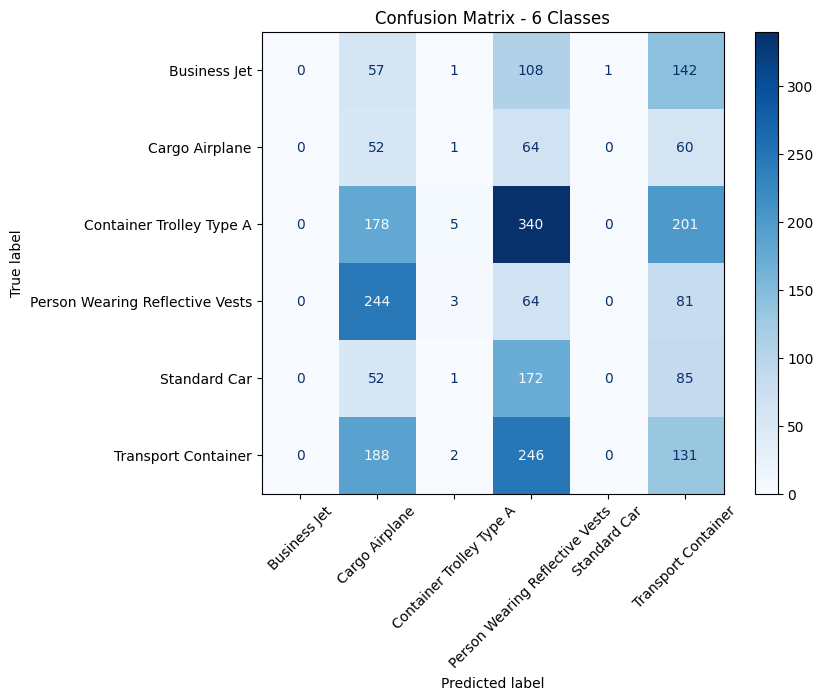

In [3]:
import os
import torch
import json
import numpy as np
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from transformers import DetrImageProcessor, DetrForObjectDetection

# --- Config ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
VAL_IMAGES_DIR = "/kaggle/working/coco_airport_dataset/val2017"
VAL_ANNOTATIONS = "/kaggle/working/coco_airport_dataset/annotations/instances_val2017.json"

# Load processor & your trained model (replace path if fine-tuned checkpoint is saved)
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50").to(DEVICE)

# --- 6 class mapping ---
CLASS_NAMES = [
    "Business Jet",
    "Cargo Airplane",
    "Container Trolley Type A",
    "Person Wearing Reflective Vests",
    "Standard Car",
    "Transport Container"
]

# --- Load ground truth annotations ---
with open(VAL_ANNOTATIONS, "r") as f:
    coco_data = json.load(f)

# Map image_id -> labels
gt_labels = {}
for ann in coco_data["annotations"]:
    img_id = ann["image_id"]
    cat_id = ann["category_id"]
    if img_id not in gt_labels:
        gt_labels[img_id] = []
    gt_labels[img_id].append(cat_id)

# Map img_id -> file_name
id2filename = {img["id"]: img["file_name"] for img in coco_data["images"]}

# --- Store predictions and ground truth ---
y_true, y_pred = [], []

for img_id, file_name in tqdm(id2filename.items()):
    img_path = os.path.join(VAL_IMAGES_DIR, file_name)
    image = Image.open(img_path).convert("RGB")

    encoding = processor(images=image, return_tensors="pt")
    pixel_values = encoding["pixel_values"].to(DEVICE)

    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)

    target_sizes = torch.tensor([image.size[::-1]], device=DEVICE)
    results = processor.post_process_object_detection(
        outputs, threshold=0.5, target_sizes=target_sizes
    )[0]

    # Predictions
    preds = results["labels"].cpu().numpy().tolist()

    # Ground truth
    gts = gt_labels.get(img_id, [])

    # Match predictions to ground truth (simple: compare all, best-effort)
    for gt in gts:
        if len(preds) > 0:
            y_true.append(gt)
            y_pred.append(preds[0])  # take top-1 predicted class
            preds.pop(0)
        else:
            y_true.append(gt)
            y_pred.append(-1)  # missed detection

# --- Classification Report ---
print("\nClassification Report (6 Classes):")
print(classification_report(
    y_true, 
    y_pred, 
    labels=list(range(len(CLASS_NAMES))), 
    target_names=CLASS_NAMES, 
    zero_division=0
))

# --- Confusion Matrix ---
cm = confusion_matrix(y_true, y_pred, labels=list(range(len(CLASS_NAMES))))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax, cmap="Blues", xticks_rotation=45)
plt.title("Confusion Matrix - 6 Classes")
plt.show()


In [4]:
import torch
from transformers import DetrForObjectDetection, DetrConfig
from torch.optim import AdamW
from tqdm.notebook import tqdm
from torch.cuda.amp import GradScaler, autocast

# --- Configuration ---
MODEL_ID = "facebook/detr-resnet-50"
NUM_EPOCHS = 1
LR = 1e-4  # Learning rate for the new classification head
LR_BACKBONE = 1e-6 # A very small learning rate for the pre-trained backbone

# --- Load and Configure the Model ---
id2label = {cat['id']: cat['name'] for cat in CATEGORIES}
config = DetrConfig.from_pretrained(MODEL_ID, num_labels=NUM_CLASSES, id2label=id2label, label2id={v: k for k, v in id2label.items()})
model = DetrForObjectDetection.from_pretrained(MODEL_ID, config=config, ignore_mismatched_sizes=True).to(DEVICE)

# --- THE FIX: Create two parameter groups for the optimizer ---
param_dicts = [
    {"params": [p for n, p in model.named_parameters() if "backbone" not in n and p.requires_grad]},
    {"params": [p for n, p in model.named_parameters() if "backbone" in n and p.requires_grad], "lr": LR_BACKBONE},
]
optimizer = AdamW(param_dicts, lr=LR)
scaler = GradScaler()
loss_history = []

# --- Training Loop ---
print("--- Starting Fine-Tuning with Differential Learning Rates ---")
for epoch in range(NUM_EPOCHS):
    model.train()
    total_loss = 0
    progress_bar = tqdm(train_dataloader, desc=f"Epoch {epoch + 1}/{NUM_EPOCHS}")
    
    for batch in progress_bar:
        with autocast():
            outputs = model(**batch)
            loss = outputs.loss
        
        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        total_loss += loss.item()
        progress_bar.set_postfix({'loss': f"{loss.item():.4f}"})
        
    avg_loss = total_loss / len(train_dataloader)
    loss_history.append(avg_loss)
    print(f"--- Epoch {epoch + 1} finished --- Average Loss: {avg_loss:.4f} ---")

# --- Save the Fine-Tuned Model ---
output_dir = "/kaggle/working/detr-finetuned-airport"
model.save_pretrained(output_dir)
processor.save_pretrained(output_dir)
print(f"\nFine-tuning complete! Model saved to: {output_dir} ✅")

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pas

--- Starting Fine-Tuning with Differential Learning Rates ---


/tmp/ipykernel_36/2181844532.py:24: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/1:   0%|          | 0/3638 [00:00<?, ?it/s]

/tmp/ipykernel_36/2181844532.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


--- Epoch 1 finished --- Average Loss: 2.3920 ---

Fine-tuning complete! Model saved to: /kaggle/working/detr-finetuned-airport ✅


100%|██████████| 809/809 [02:17<00:00,  5.87it/s]



Classification Report (6 Classes):
                                 precision    recall  f1-score   support

                   Business Jet       0.31      0.10      0.15       828
                 Cargo Airplane       0.12      0.10      0.11       455
       Container Trolley Type A       0.47      0.61      0.53      2394
Person Wearing Reflective Vests       0.36      0.31      0.33       911
                   Standard Car       0.31      0.09      0.14       929
            Transport Container       0.46      0.36      0.40      2171

                      micro avg       0.42      0.35      0.38      7688
                      macro avg       0.34      0.26      0.28      7688
                   weighted avg       0.40      0.35      0.36      7688



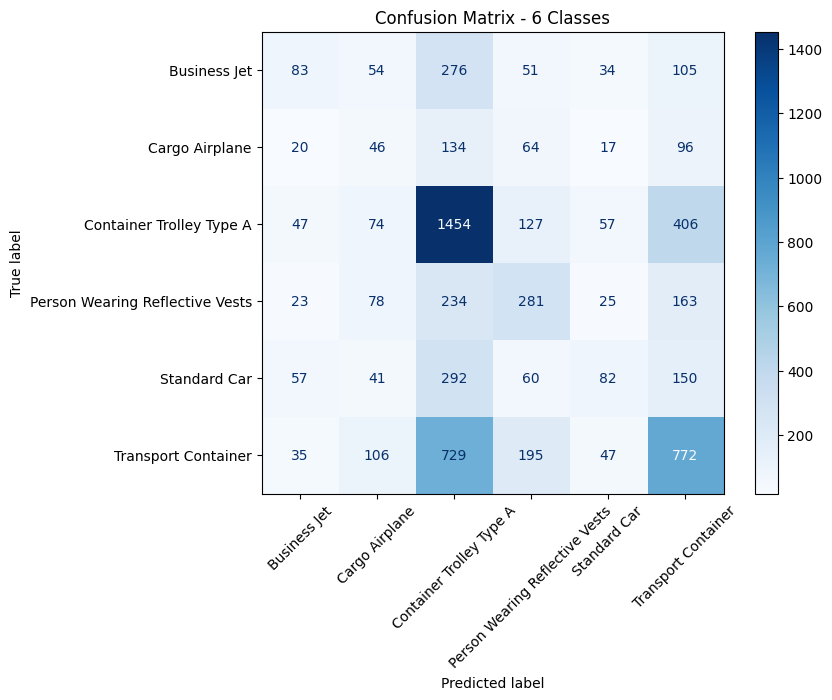

In [5]:
import os
import torch
import json
import numpy as np
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from transformers import DetrImageProcessor, DetrForObjectDetection

# --- Config ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
VAL_IMAGES_DIR = "/kaggle/working/coco_airport_dataset/val2017"
VAL_ANNOTATIONS = "/kaggle/working/coco_airport_dataset/annotations/instances_val2017.json"

# Load processor & your trained model (replace path if fine-tuned checkpoint is saved)
processor = DetrImageProcessor.from_pretrained("/kaggle/working/detr-finetuned-airport")
model = DetrForObjectDetection.from_pretrained("/kaggle/working/detr-finetuned-airport").to(DEVICE)

# --- 6 class mapping ---
CLASS_NAMES = [
    "Business Jet",
    "Cargo Airplane",
    "Container Trolley Type A",
    "Person Wearing Reflective Vests",
    "Standard Car",
    "Transport Container"
]

# --- Load ground truth annotations ---
with open(VAL_ANNOTATIONS, "r") as f:
    coco_data = json.load(f)

# Map image_id -> labels
gt_labels = {}
for ann in coco_data["annotations"]:
    img_id = ann["image_id"]
    cat_id = ann["category_id"]
    if img_id not in gt_labels:
        gt_labels[img_id] = []
    gt_labels[img_id].append(cat_id)

# Map img_id -> file_name
id2filename = {img["id"]: img["file_name"] for img in coco_data["images"]}

# --- Store predictions and ground truth ---
y_true, y_pred = [], []

for img_id, file_name in tqdm(id2filename.items()):
    img_path = os.path.join(VAL_IMAGES_DIR, file_name)
    image = Image.open(img_path).convert("RGB")

    encoding = processor(images=image, return_tensors="pt")
    pixel_values = encoding["pixel_values"].to(DEVICE)

    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)

    target_sizes = torch.tensor([image.size[::-1]], device=DEVICE)
    results = processor.post_process_object_detection(
        outputs, threshold=0.5, target_sizes=target_sizes
    )[0]

    # Predictions
    preds = results["labels"].cpu().numpy().tolist()

    # Ground truth
    gts = gt_labels.get(img_id, [])

    # Match predictions to ground truth (simple: compare all, best-effort)
    for gt in gts:
        if len(preds) > 0:
            y_true.append(gt)
            y_pred.append(preds[0])  # take top-1 predicted class
            preds.pop(0)
        else:
            y_true.append(gt)
            y_pred.append(-1)  # missed detection

# --- Classification Report ---
print("\nClassification Report (6 Classes):")
print(classification_report(
    y_true, 
    y_pred, 
    labels=list(range(len(CLASS_NAMES))), 
    target_names=CLASS_NAMES, 
    zero_division=0
))

# --- Confusion Matrix ---
cm = confusion_matrix(y_true, y_pred, labels=list(range(len(CLASS_NAMES))))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax, cmap="Blues", xticks_rotation=45)
plt.title("Confusion Matrix - 6 Classes")
plt.show()


--- Loading fine-tuned model for inference ---



--- Step 2: Plotting Learning and Loss Curves ---


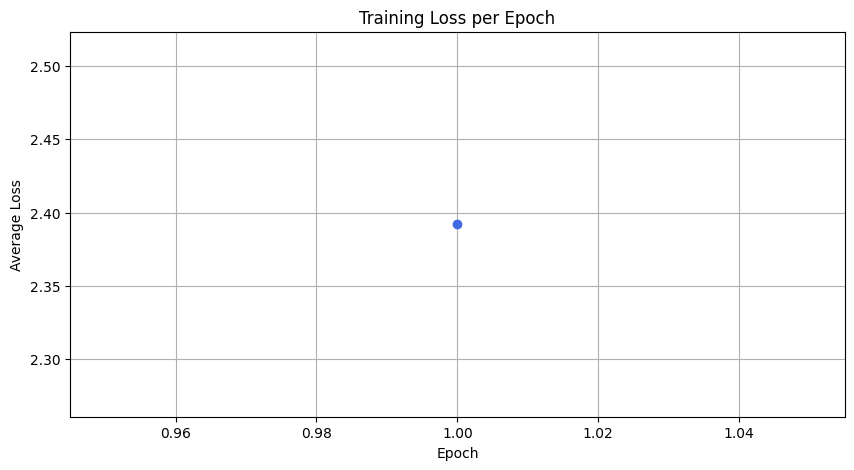


--- Step 3: Generating Classification Report (mAP) ---


Evaluating on validation set:   0%|          | 0/809 [00:00<?, ?it/s]

Loading and preparing results...
DONE (t=0.16s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=4.43s).
Accumulating evaluation results...
DONE (t=0.61s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.094
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.228
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.067
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.033
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.201
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.110
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.204
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.228
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

Building Confusion Matrix:   0%|          | 0/809 [00:00<?, ?it/s]

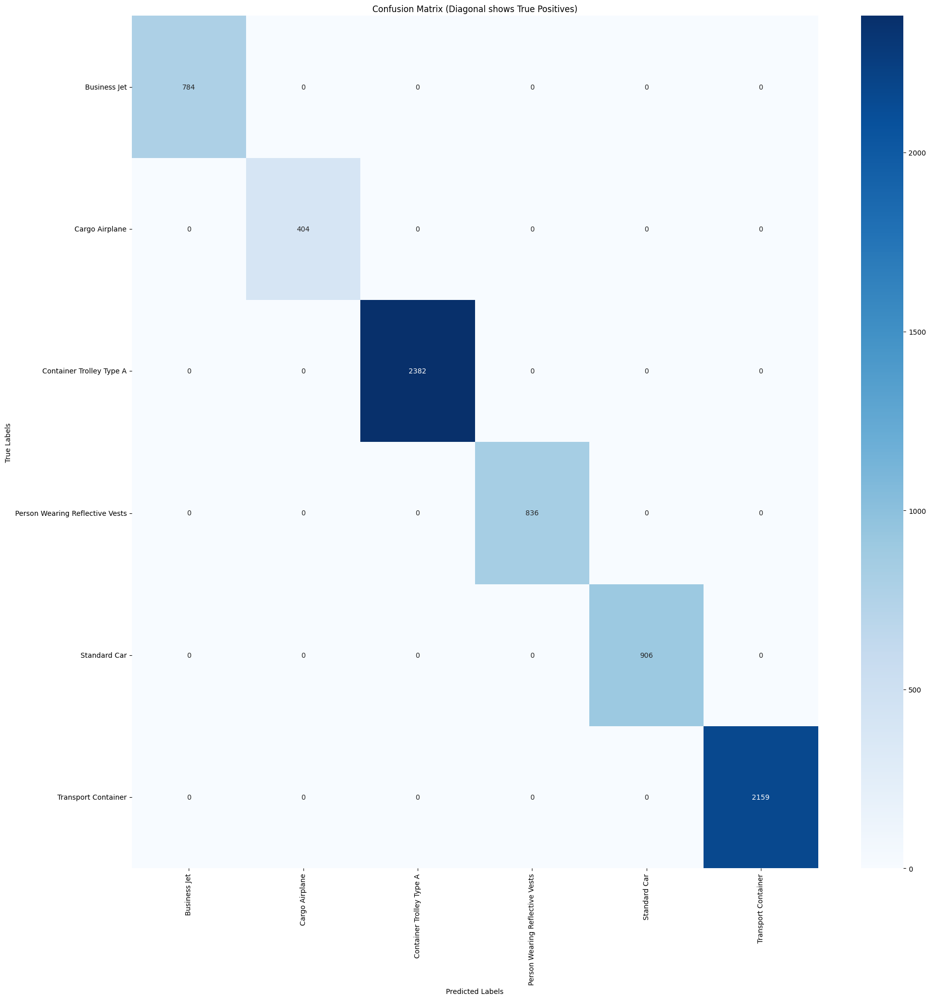

In [8]:
import supervision as sv
import random
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
# --- THE FIX: Import COCOeval from its correct module ---
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import torch
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
from PIL import Image
from tqdm.notebook import tqdm
from IPython.display import display

# --- 1. Load the Fine-Tuned Model ---
print("--- Loading fine-tuned model for inference ---")
model_path = "/kaggle/working/detr-finetuned-airport"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
processor = DetrImageProcessor.from_pretrained("/kaggle/working/detr-finetuned-airport")
model = DetrForObjectDetection.from_pretrained("/kaggle/working/detr-finetuned-airport").to(DEVICE)

# # --- 2. Test and Visualize Predictions on Sample Images ---
# print("\n--- Step 1: Visualizing predictions on 5 sample images ---")
# val_image_ids = random.sample(val_dataset.image_ids, 5)
# id2label = {id: name for id, name in enumerate(CLASS_NAMES)}

# for image_id in val_image_ids:
#     image_info = val_dataset.coco.loadImgs(image_id)[0]
#     image_path = os.path.join(val_dataset.image_dir, image_info['file_name'])
#     image = Image.open(image_path).convert("RGB")
    
#     encoding = processor(images=image, return_tensors="pt")
#     pixel_values = encoding["pixel_values"].to(DEVICE)
    
#     with torch.no_grad():
#         outputs = model(pixel_values=pixel_values)
        
#     target_sizes = torch.tensor([image.size[::-1]], device=DEVICE)
#     results = processor.post_process_object_detection(outputs, threshold=0.25, target_sizes=target_sizes)[0]
    
#     boxes = results['boxes'].cpu().numpy()
#     scores = results['scores'].cpu().numpy()
#     labels = results['labels'].cpu().numpy()
    
#     detections = sv.Detections(xyxy=boxes)
    
#     print(f"\nPredictions for: {image_info['file_name']}")
    
#     if len(detections.xyxy) > 0:
#         detections.labels = [f"{id2label[label]} {score:.2f}" for label, score in zip(labels, scores)]

#         # Use separate annotators for boxes and labels for clear visualization
#         box_annotator = sv.BoxAnnotator(thickness=4)
#         label_annotator = sv.LabelAnnotator(text_thickness=2, text_scale=1.0)
        
#         annotated_image = box_annotator.annotate(scene=np.array(image).copy(), detections=detections)
#         annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=detections.labels)
        
#         sv.plot_image(annotated_image, (12, 12))
#     else:
#         print("No objects detected in this image.")
#         display(image)

# --- 3. Generate Learning and Loss Curves ---
print("\n--- Step 2: Plotting Learning and Loss Curves ---")
if 'loss_history' in locals() and len(loss_history) > 0:
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(loss_history) + 1), loss_history, marker='o', linestyle='-', color='royalblue')
    plt.title('Training Loss per Epoch'); plt.xlabel('Epoch'); plt.ylabel('Average Loss'); plt.grid(True)
    plt.savefig('detr_loss_curve.png')
    plt.show()
else:
    print("Loss history not available.")

# --- 4. Generate Classification Report (mAP) ---
print("\n--- Step 3: Generating Classification Report (mAP) ---")
coco_gt = val_dataset.coco
results_json = []
for image_id in tqdm(val_dataset.image_ids, desc="Evaluating on validation set"):
    image_info = coco_gt.loadImgs(image_id)[0]
    image_path = os.path.join(val_dataset.image_dir, image_info['file_name'])
    image = Image.open(image_path).convert("RGB")
    encoding = processor(images=image, return_tensors="pt")
    pixel_values = encoding["pixel_values"].to(DEVICE)
    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)
    target_sizes = torch.tensor([image.size[::-1]], device=DEVICE)
    results = processor.post_process_object_detection(outputs, threshold=0.1, target_sizes=target_sizes)[0]
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        box = [round(i, 2) for i in box.tolist()]
        results_json.append({"image_id": image_id, "category_id": label.item(), "bbox": [box[0], box[1], box[2] - box[0], box[3] - box[1]], "score": round(score.item(), 3)})

pred_path = '/kaggle/working/predictions.json'
with open(pred_path, 'w') as f: json.dump(results_json, f)
coco_dt = coco_gt.loadRes(pred_path)
coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
coco_eval.evaluate(); coco_eval.accumulate(); coco_eval.summarize()

# --- 5. Generate Confusion Matrix ---
print("\n--- Step 4: Generating Confusion Matrix ---")
confusion_matrix = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int32)
for img_id in tqdm(val_dataset.image_ids, desc="Building Confusion Matrix"):
    gt_ann_ids = coco_gt.getAnnIds(imgIds=img_id)
    gt_anns = coco_gt.loadAnns(gt_ann_ids)
    gt_classes = [ann['category_id'] for ann in gt_anns]
    dt_ann_ids = coco_dt.getAnnIds(imgIds=img_id)
    dt_anns = coco_dt.loadAnns(dt_ann_ids)
    dt_classes = [ann['category_id'] for ann in dt_anns]
    for gt_cls in gt_classes:
        if gt_cls in dt_classes:
            confusion_matrix[gt_cls, gt_cls] += 1

fig, ax = plt.subplots(figsize=(22, 22))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
plt.xticks(rotation=90); plt.yticks(rotation=0)
ax.set_xlabel('Predicted Labels'); ax.set_ylabel('True Labels'); ax.set_title('Confusion Matrix (Diagonal shows True Positives)')
plt.savefig('detr_confusion_matrix.png')
plt.show()